# Homework4-Govreport-Textmining
## 卢家希
## 学号 15210130070

In [2]:
with open('C:/cjc2016/data/gov_reports1954-2016.txt', 'r') as f:
    reports = f.readlines()

In [3]:

%matplotlib inline
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import sys 
import numpy as np
from collections import defaultdict
import statsmodels.api as sm
from wordcloud import WordCloud
import jieba
import matplotlib
import gensim
from gensim import corpora, models, similarities
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
matplotlib.rcParams['font.sans-serif'] = ['Microsoft YaHei']
matplotlib.rc("savefig", dpi=400)

In [5]:
filename = 'C:/cjc2016/data/stopwords.txt'
stopwords = {}
f = open(filename, 'r')
line = f.readline().rstrip()
while line:
    stopwords.setdefault(line, 0)
    stopwords[line.decode('utf-8')] = 1
    line = f.readline().rstrip()
f.close()

In [6]:
adding_stopwords = [u'我们', u'要', u'地', u'有', u'这', u'人',
                    u'发展',u'建设',u'加强',u'继续',u'对',u'等',u'推进',u'工作',u'增加']
for s in adding_stopwords: stopwords[s]=10

In [7]:
import jieba.analyse
txt = reports[-1]
tf = jieba.analyse.extract_tags(txt, topK=200, withWeight=True)

Building prefix dict from the default dictionary ...
Dumping model to file cache c:\users\lenovo\appdata\local\temp\jieba.cache
Loading model cost 1.387 seconds.
Prefix dict has been built succesfully.


In [8]:
print u"、".join([i[0] for i in tf[:50]])

发展、推进、改革、建设、创新、加快、经济、加强、促进、实施、政府、推动、完善、政策、全面、增长、社会、就业、企业、提高、创业、扩大、制度、坚持、一批、深化、人民、落实、支持、农村、试点、实现、安全、合作、工作、我国、动能、机制、加大、服务业、城镇、我们、服务、取得、依法、积极、中国、深入、结构性、民生


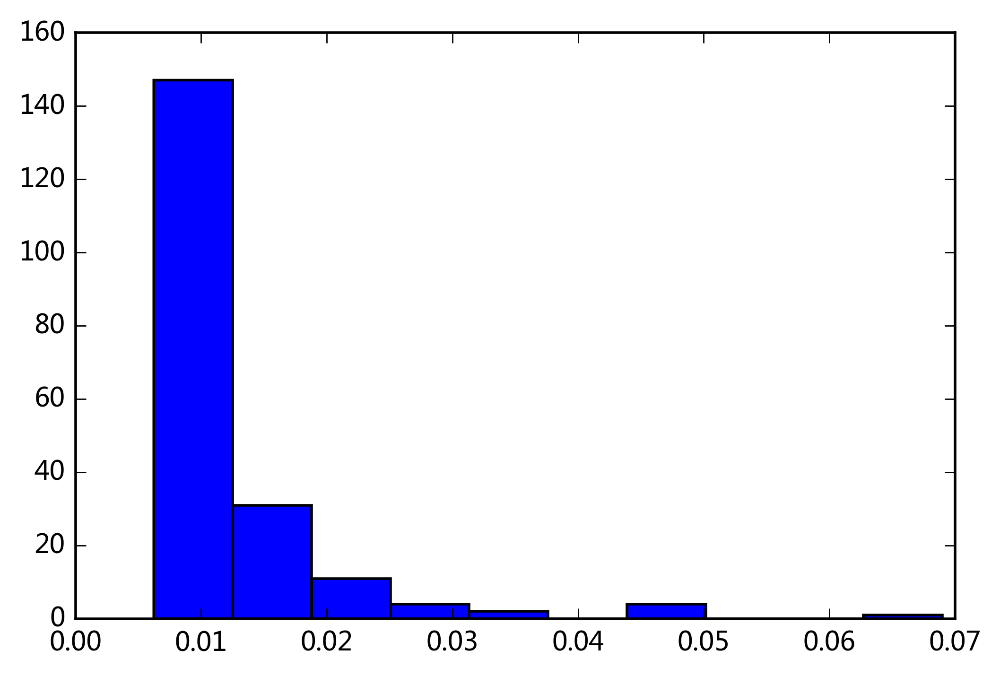

In [9]:
plt.hist([i[1] for i in tf])
plt.show()

In [10]:
tr = jieba.analyse.textrank(txt,topK=200, withWeight=True)
print u"、".join([i[0] for i in tr[:50]])

发展、建设、经济、改革、推进、创新、加强、加快、政府、推动、促进、实施、企业、政策、社会、制度、中国、提高、完善、全面、增长、扩大、支持、实现、工作、机制、人民、创业、服务、农村、试点、地方、坚持、国家、国际、继续、就业、合作、基本、加大、农业、投资、保护、问题、地区、依法、工程、取得、鼓励、建立


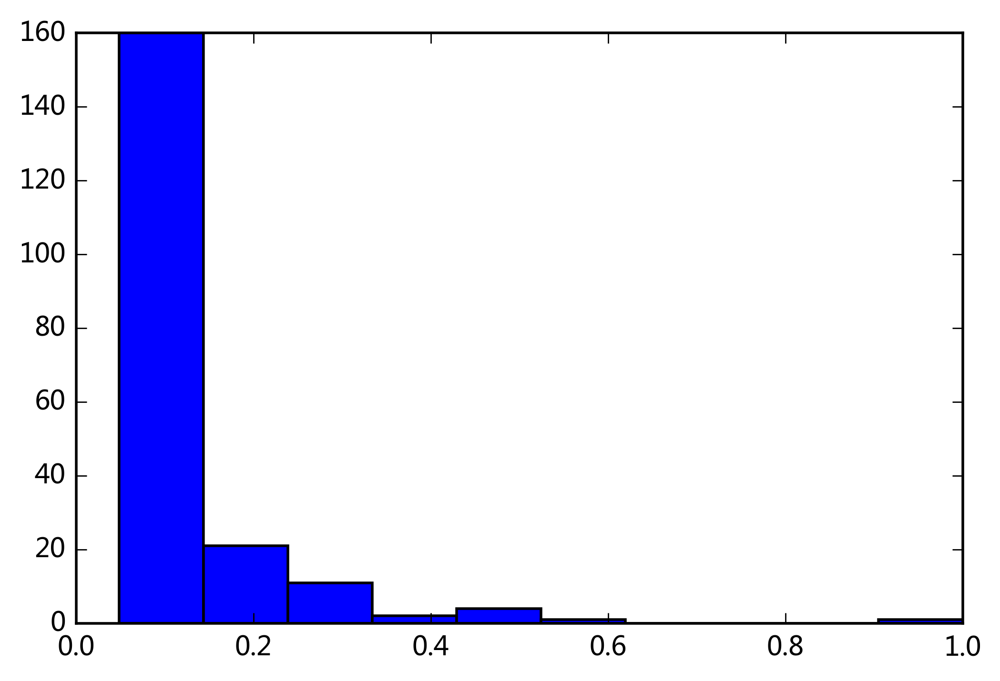

In [11]:
plt.hist([i[1] for i in tr])
plt.show()

In [14]:
import pandas as pd

def keywords(index):
    txt = reports[-index]
    tf = jieba.analyse.extract_tags(txt, topK=200, withWeight=True)
    tr = jieba.analyse.textrank(txt,topK=200, withWeight=True)
    tfdata = pd.DataFrame(tf, columns=['word', 'tfidf'])
    trdata = pd.DataFrame(tr, columns=['word', 'textrank'])
    worddata = pd.merge(tfdata, trdata, on='word')
    plt.plot(worddata.tfidf, worddata.textrank, linestyle='',marker='.')
    for i in range(len(worddata.word)):
        plt.text(worddata.tfidf[i], worddata.textrank[i], worddata.word[i], 
                 fontsize = worddata.textrank[i]*15, color = 'red', rotation = 0)
    plt.title(txt[:4])
    plt.xlabel('Tf-Idf')
    plt.ylabel('TextRank')
    plt.show()

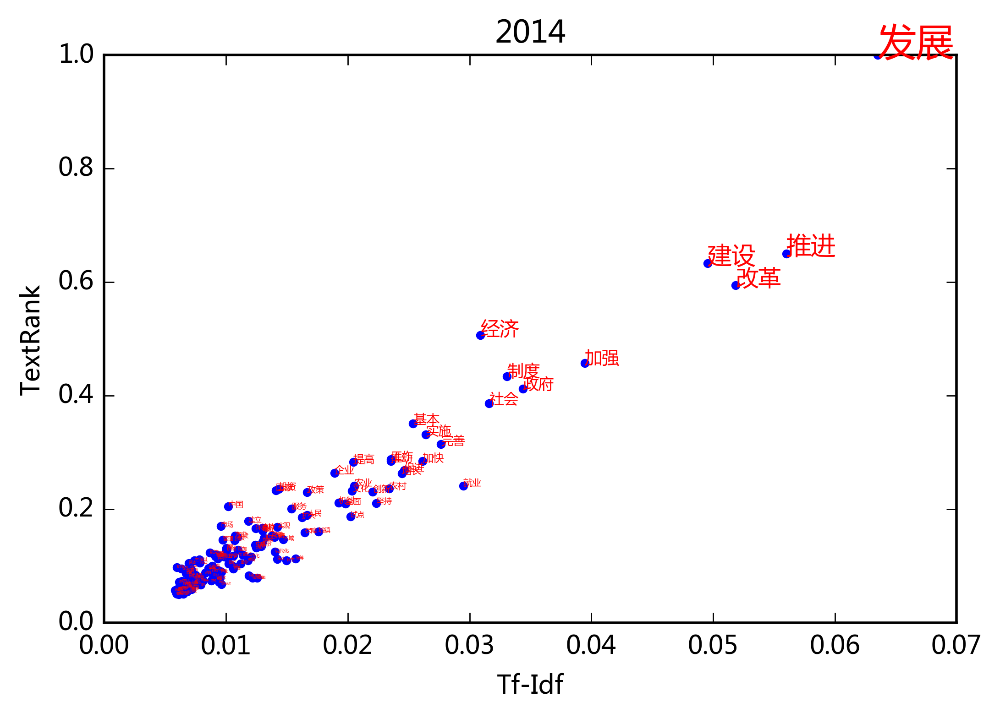

In [15]:
keywords(3)

In [17]:
def wordcloudplot(txt, year):
    wordcloud = WordCloud(font_path='C:/cjc2016/data/msyh.ttf').generate(txt)
    # Open a plot of the generated image.
    plt.imshow(wordcloud)
    plt.title(year)
    plt.axis("off")
    #plt.show()

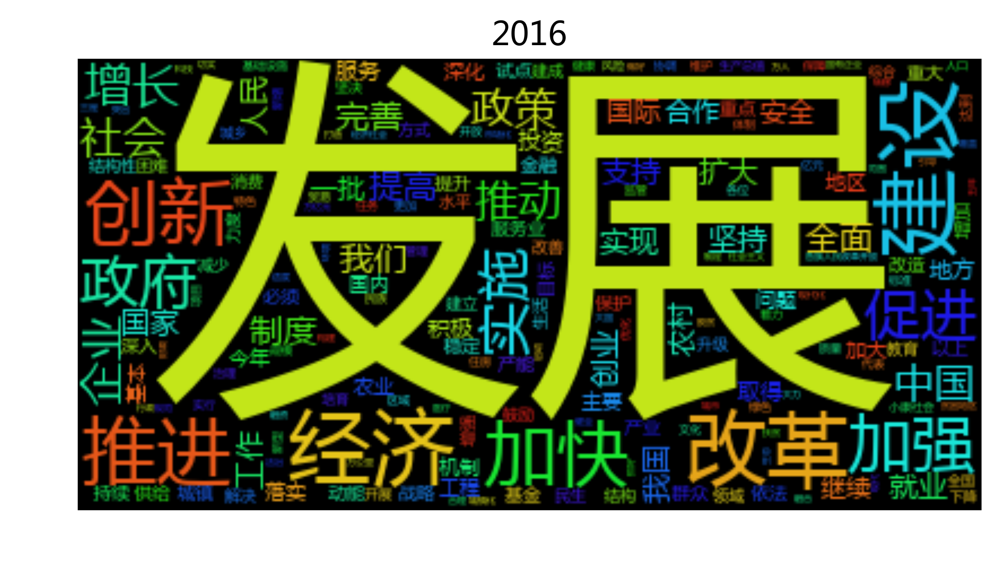

In [19]:
txt = reports[-1]
tfidf200= jieba.analyse.extract_tags(txt, topK=200, withWeight=False)
seg_list = jieba.cut(txt, cut_all=False)
seg_list = [i for i in seg_list if i in tfidf200]
txt200 = r' '.join(seg_list)
wordcloudplot(txt200, txt[:4])

In [20]:
wordfreq = defaultdict(int)
for i in seg_list:
    wordfreq[i] +=1
wordfreq = [[i, wordfreq[i]] for i in wordfreq]

wordfreq.sort(key= lambda x:x[1], reverse = True )
print u"、 ".join([ i[0] + u'（' + str(i[1]) +u'）' for i in wordfreq ])

发展（139）、 建设（68）、 经济（67）、 改革（62）、 推进（62）、 创新（56）、 加快（42）、 加强（41）、 政府（40）、 促进（37）、 实施（36）、 增长（36）、 企业（35）、 政策（35）、 推动（34）、 社会（34）、 中国（32）、 提高（31）、 我们（30）、 全面（28）、 完善（27）、 扩大（26）、 工作（26）、 制度（26）、 实现（25）、 就业（24）、 人民（24）、 支持（24）、 坚持（23）、 我国（22）、 国家（21）、 一批（21）、 创业（21）、 安全（21）、 农村（20）、 合作（20）、 国际（20）、 继续（19）、 地方（19）、 服务（19）、 投资（19）、 积极（19）、 取得（19）、 基本（18）、 落实（18）、 加大（18）、 机制（18）、 今年（18）、 地区（17）、 问题（17）、 农业（17）、 深化（17）、 主要（17）、 国内（16）、 工程（16）、 试点（16）、 目标（16）、 以上（16）、 城镇（15）、 保护（15）、 深入（15）、 重大（15）、 服务业（14）、 必须（14）、 增加（14）、 群众（14）、 动能（14）、 持续（14）、 依法（14）、 重点（14）、 产业（13）、 提升（13）、 改造（13）、 基金（13）、 金融（13）、 产能（13）、 供给（13）、 战略（13）、 稳定（13）、 力度（13）、 减少（13）、 领域（13）、 结构性（13）、 民生（13）、 结构（12）、 建成（12）、 教育（12）、 解决（12）、 增强（12）、 水平（12）、 消费（12）、 生活（12）、 升级（12）、 鼓励（12）、 方式（12）、 建立（12）、 改善（12）、 困难（11）、 全国（11）、 培育（11）、 开展（11）、 坚决（11）、 达到（11）、 城乡（11）、 综合（11）、 下降（10）、 生产总值（10）、 健康（10）、 特色（10）、 优化（10）、 住房（10）、 规模（10）、 风险（10）、 任务（10）、 管理（10）、 项目（10）、 质量（10）、 保障（10）、 更加（10）、 实行（10）、 亿元（10）、 新增（10）、 治理（10）、 代表（10）、 监管（

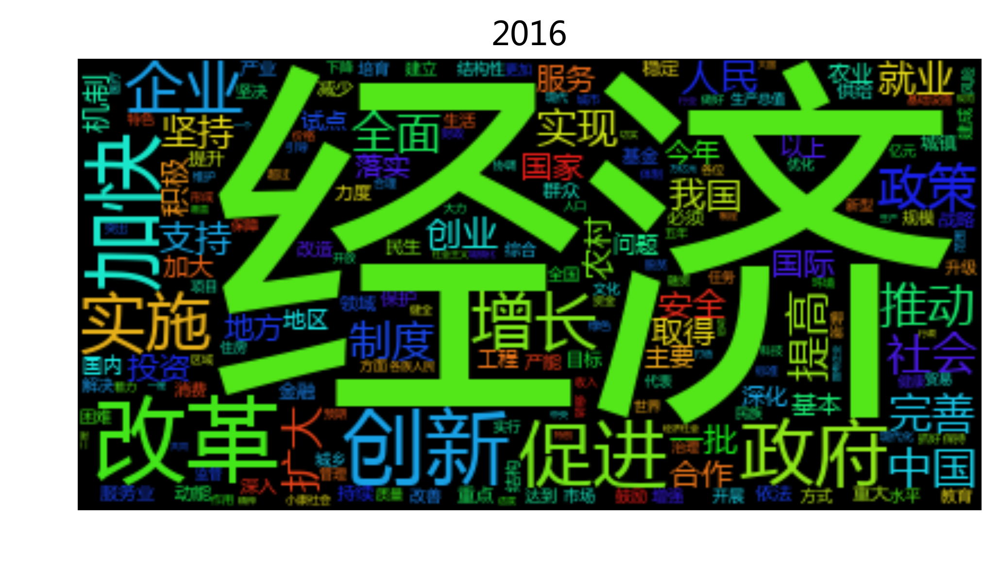

In [21]:
txt = reports[-1]
seg_list = jieba.cut(txt, cut_all=False)
seg_list = [i for i in seg_list if i not in stopwords]
txt = r' '.join(seg_list)
wordcloudplot(txt, txt[:4])

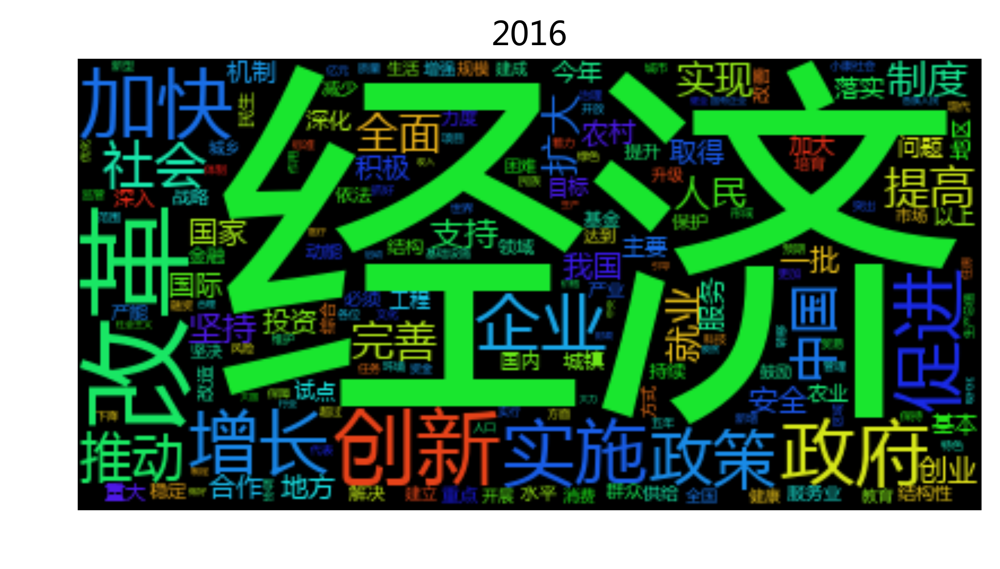

In [23]:
for txt in reports:
    seg_list = jieba.cut(txt, cut_all=False)
    seg_list = [i for i in seg_list if i not in stopwords]
    txt = r' '.join(seg_list)
    wordcloudplot(txt, txt[:4]) 
    file_path = 'C:/Users/lenovo/Desktop/homework/ciyun' + txt[:4] + '.png'
    plt.savefig(file_path,dpi = 400, bbox_inches="tight",transparent = True)

In [25]:
import jieba.analyse

wordset = []
for txt in reports:
    top20= jieba.analyse.textrank(txt, topK=200, withWeight=False)
    for w in top20:
        if w not in wordset:
            wordset.append(w)

In [26]:
print ' '.join(wordset)

国家 人民 工业 发展 建设 工作 生产 美国 企业 经济 计划 社会主义 中国 进行 全国 技术 亚洲 集团 需要 问题 农业 方面 完成 建立 台湾 生活 事业 没有 改造 应当 资本主义 增加 关系 组织 保证 会议 侵略 不能 注意 加强 战争 提高 社会 文化 继续 政府 现代化 能够 日内瓦 世界 东南亚 运动 起来 参加 苏联 少数民族 协议 管理 浪费 实行 群众 机关 采取 解决 得到 制度 现象 条约 改善 领导 资金 革命 集体 职工 任务 政策 地方 增长 斗争 商业 工作人员 合作 情况 农民 规定 恢复 日本 卖国 法律 比重 解放 物质 实现 劳动 原则 改进 力量 城市 工程 时期 破坏 企图 朝鲜 研究 印度支那 总产值 帮助 地区 扩大 重工业 保障 合理 教育 产品 财政 作用 依靠 才能 民主 成为 巩固 华侨 中央 任意 培养 收购 制造厂 要求 分子 供应 权利 代表 粮食 包括 棉花 基础 推广 使用 表现 节约 国际 水平 损失 公私合营 行政 全部 宪法 防务 忽视 防洪 人才 不够 产量 思想 容许 国民经济 还有 等于 准备 加以 时候 希望 干涉 大家 商品 民族 经验 大陆 适应 胜利 不顾 领土 五年计划 克服 中华人民共和国 设备 工业化 决定 达到 活动 国营商业 势力 缺点 加紧 有关 联系 支持 已有 满足 指导 开展 发挥 市场 独立 铁路 昌都地区 保卫 部门 正义 知识分子 应该 可能 投资 增产 单位 设计 工人 条件 制造 形式 建成 原料 手工业 工厂 开始 办法 资本家 规模 新建 农村 例如 过渡时期 认为 工业生产 干部 大量 职员 施工 减少 学习 土地 帝国主义 利用 援助 数量 限额 人员 指标 厂矿 加工 汽车 种类 速度 工人阶级 原有 学校 质量 科学技术 方针 政治 轻工业 错误 措施 定货 合作化 改变 经营 统治 接受 周转量 试制 改建 材料 个体 道路 工业品 面积 积极性 薯类 产值 重点 实际 建筑 促进 水利 所有制 消费品 总任务 历史 掌握 非生产性 标准 比例 预算 支出 收入 部分 执行 国营 立井 公路 项目 税收 总数 片面 数字 价格 钢材 扣除 国营企业 预计 收支 状况 兰州 拨付 货物 水库 工业部 降低 可比 过程 储备 包头 决算

In [28]:
from collections import defaultdict

data = defaultdict(dict)
years = [int(i[:4]) for i in reports]
for i in wordset:
    for year in years:
        data[i][year] = 0

In [29]:
for txt in reports:
    year = int(txt[:4])
    top1000= jieba.analyse.textrank(txt, topK=1000, withWeight=True)
    for ww in top1000:
        word, weight = ww
        if word in wordset:
            data[word][year]+= weight

In [30]:
word_weight = []
for i in data:
    word_weight.append([i, np.sum(data[i].values())])

In [31]:
word_weight.sort(key= lambda x:x[1], reverse = True )
top50 = [i[0] for i in word_weight[:50]]

In [32]:
print ' '.join(top50) 

发展 建设 经济 加强 企业 工作 改革 国家 人民 继续 社会主义 提高 社会 生产 农业 政府 制度 增加 推进 问题 促进 增长 方面 农村 管理 加快 进行 重点 坚持 全国 教育 投资 市场 工业 地区 完善 计划 实行 支持 政策 生活 中国 文化 扩大 实现 基本 改善 建立 技术 群众


In [33]:
def plotEvolution(word, color, linestyle, marker):
    cx = data[word]
    plt.plot(cx.keys(), cx.values(), color = color, 
             linestyle=linestyle, marker=marker, label= word)
    plt.legend(loc=2,fontsize=8)
    plt.ylabel(u'词语重要性')

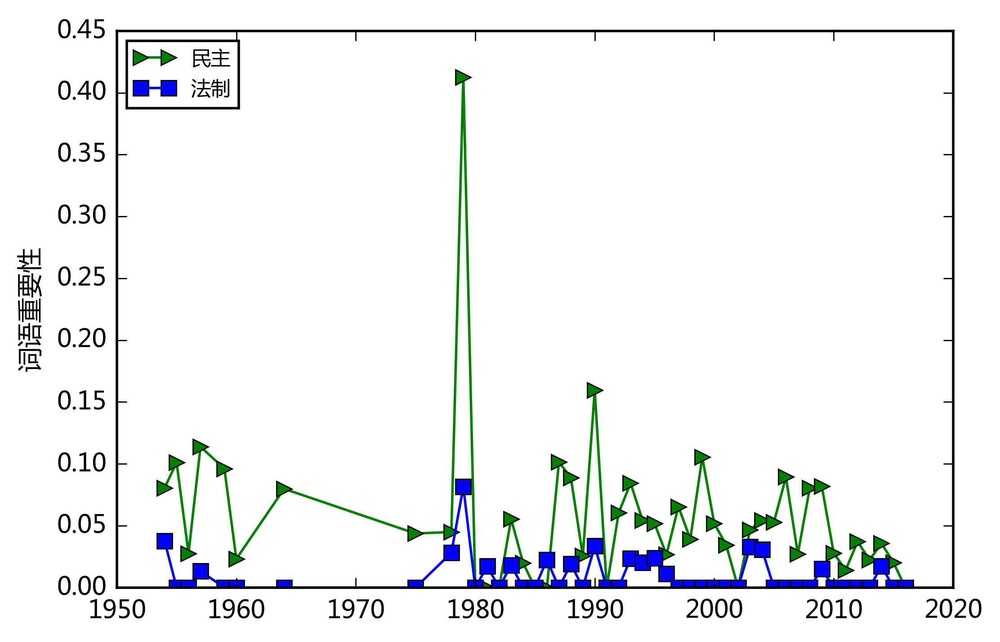

In [34]:
plotEvolution(u'民主', 'g', '-', '>')
plotEvolution(u'法制', 'b', '-', 's')

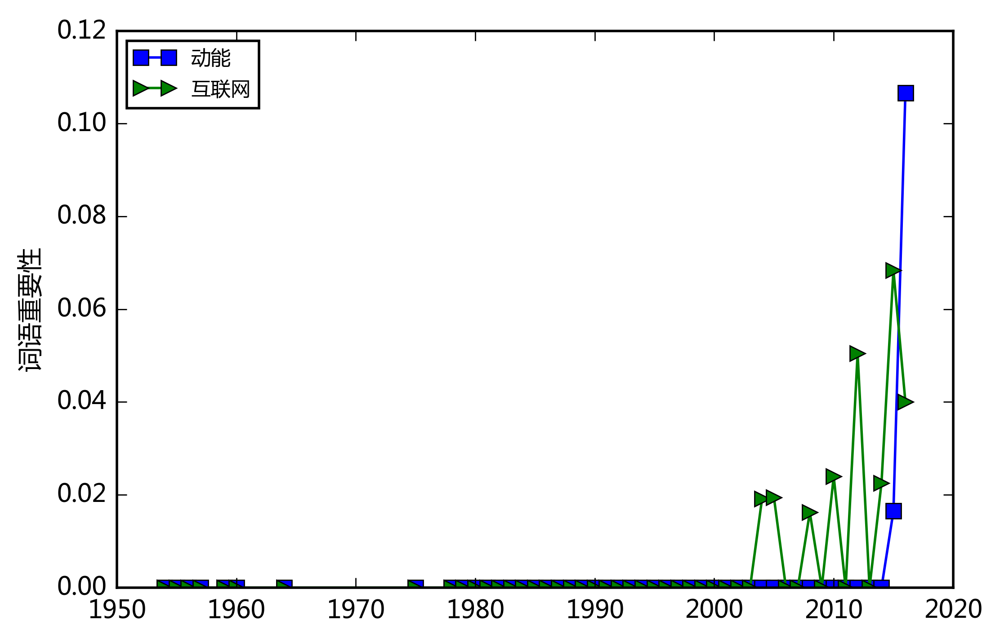

In [35]:
plotEvolution(u'动能', 'b', '-', 's')
plotEvolution(u'互联网', 'g', '-', '>')

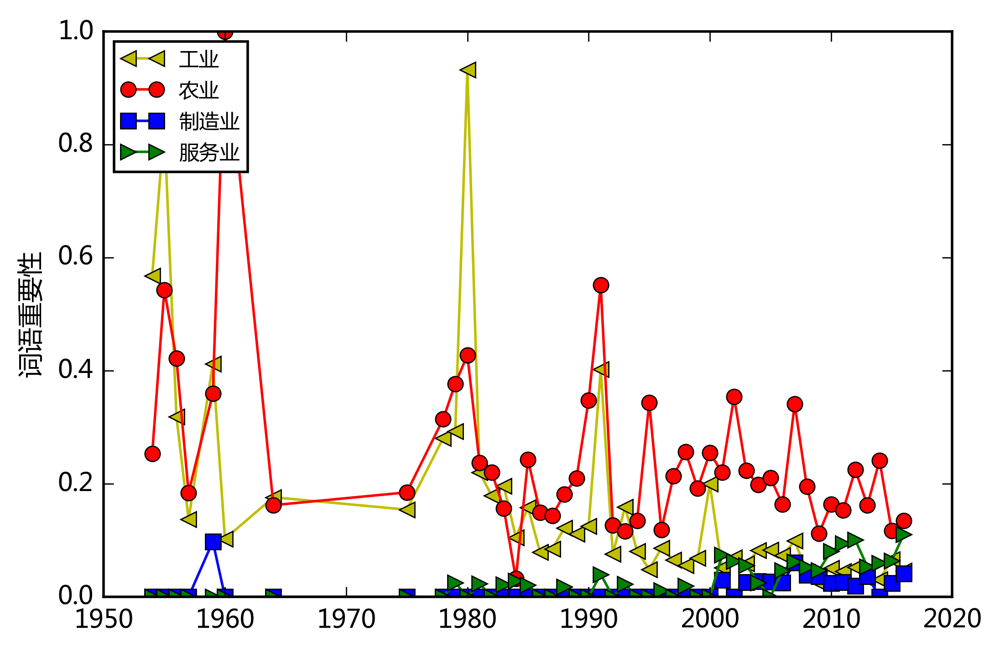

In [36]:
plotEvolution(u'工业', 'y', '-', '<')
plotEvolution(u'农业', 'r', '-', 'o')
plotEvolution(u'制造业', 'b', '-', 's')
plotEvolution(u'服务业', 'g', '-', '>')

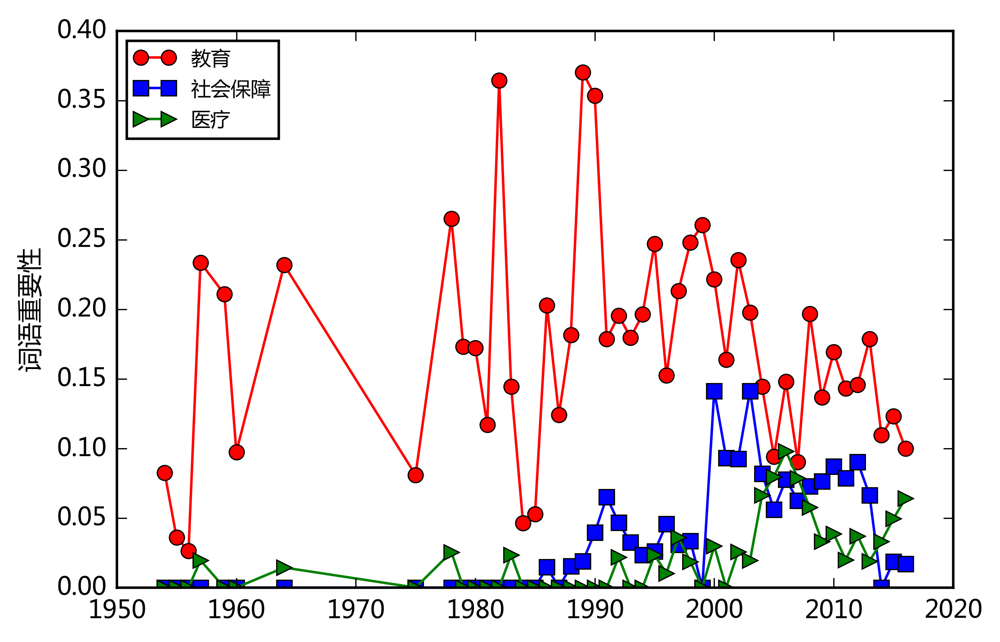

In [37]:
plotEvolution(u'教育', 'r', '-', 'o')
plotEvolution(u'社会保障', 'b', '-', 's')
plotEvolution(u'医疗', 'g', '-', '>')

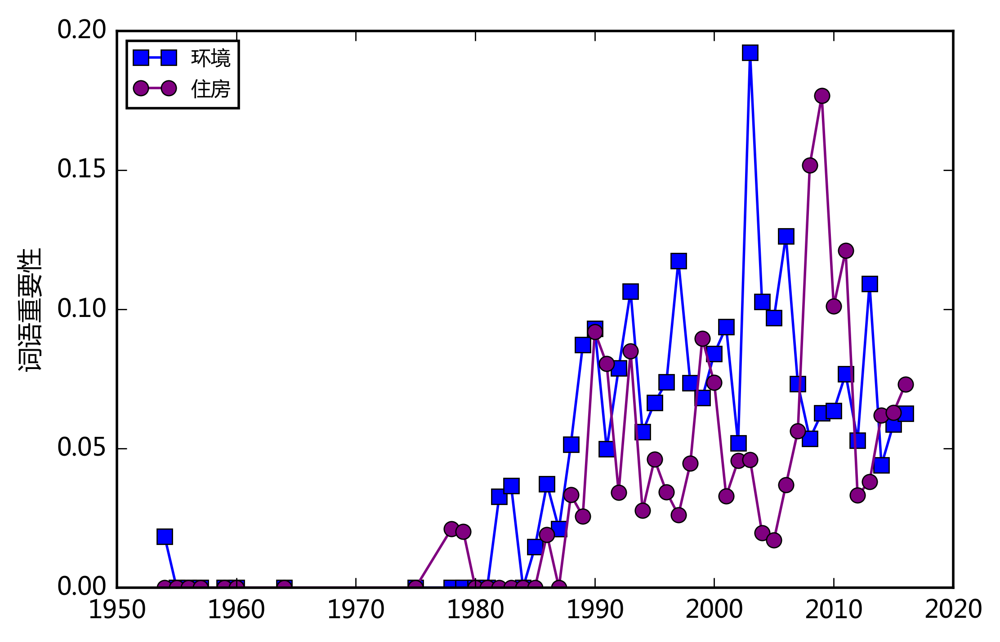

In [38]:
plotEvolution(u'环境', 'b', '-', 's')
plotEvolution(u'住房', 'purple', '-', 'o')

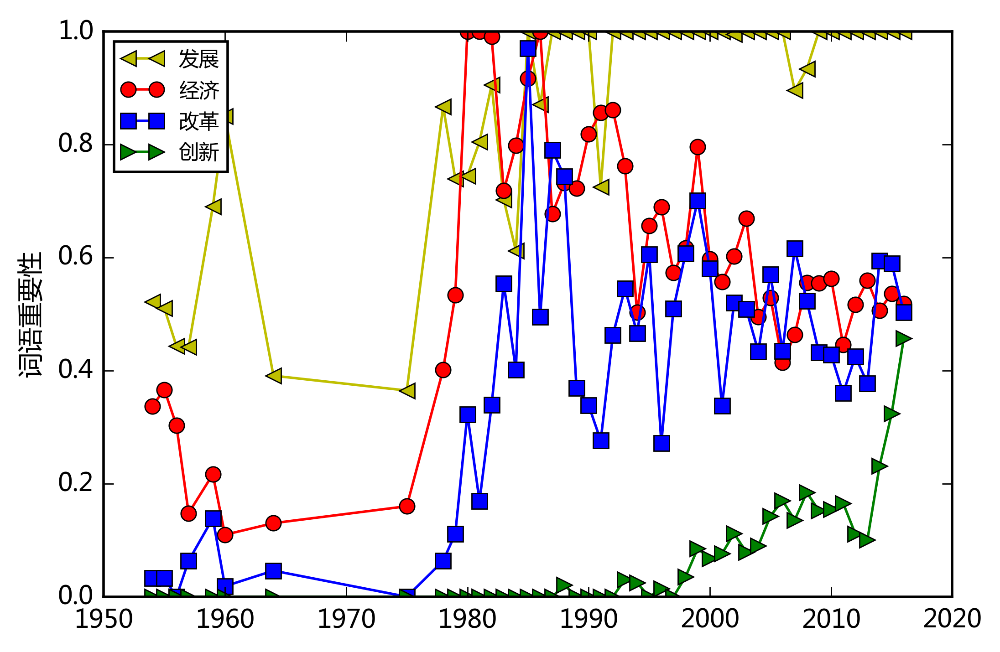

In [39]:
plotEvolution(u'发展', 'y', '-', '<')
plotEvolution(u'经济', 'r', '-', 'o')
plotEvolution(u'改革', 'b', '-', 's')
plotEvolution(u'创新', 'g', '-', '>')

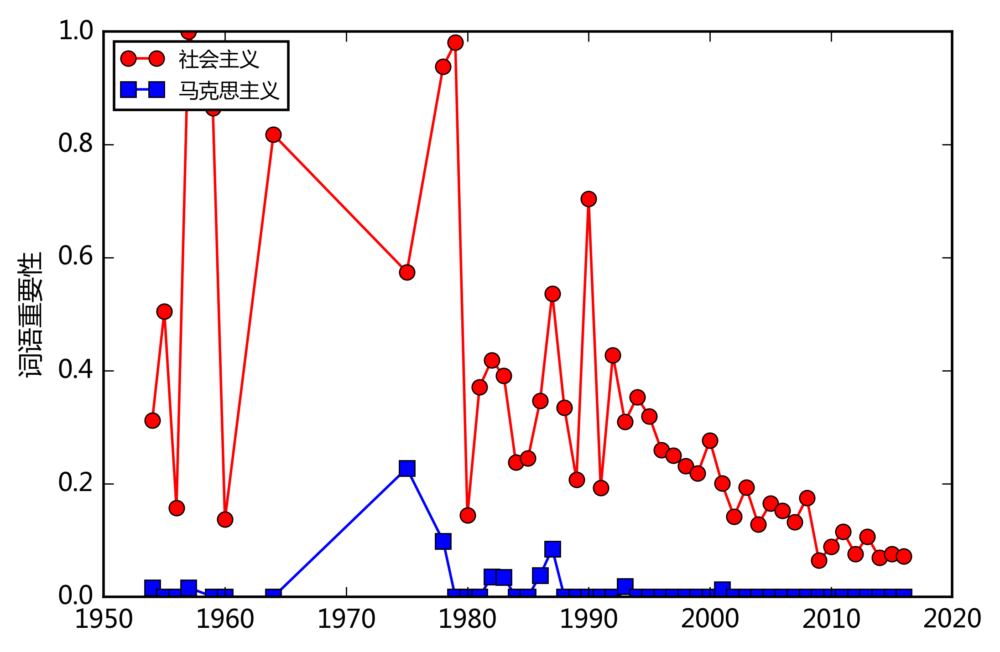

In [40]:
plotEvolution(u'社会主义', 'r', '-', 'o')
plotEvolution(u'马克思主义', 'b', '-', 's')

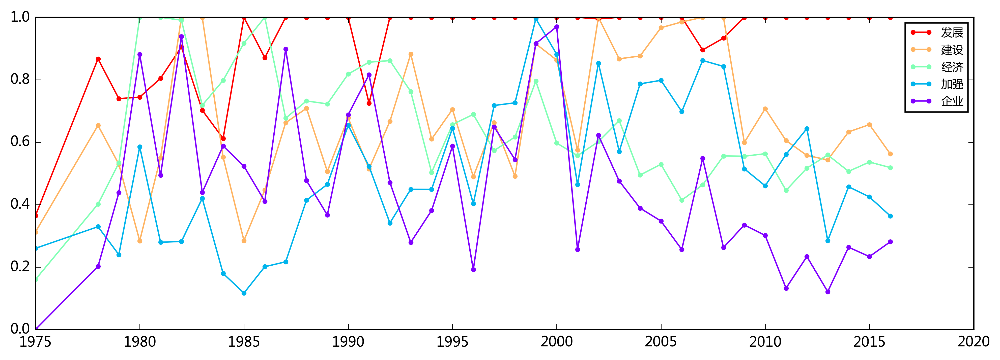

In [41]:

fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in enumerate(top50[:5]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

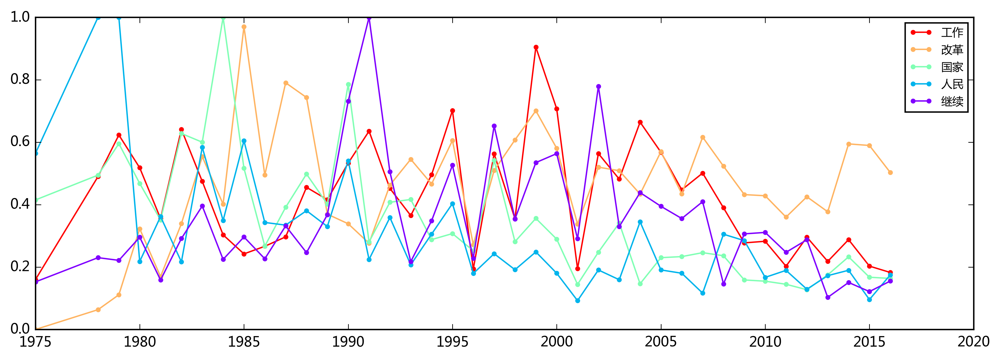

In [42]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in enumerate(top50[5:10]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

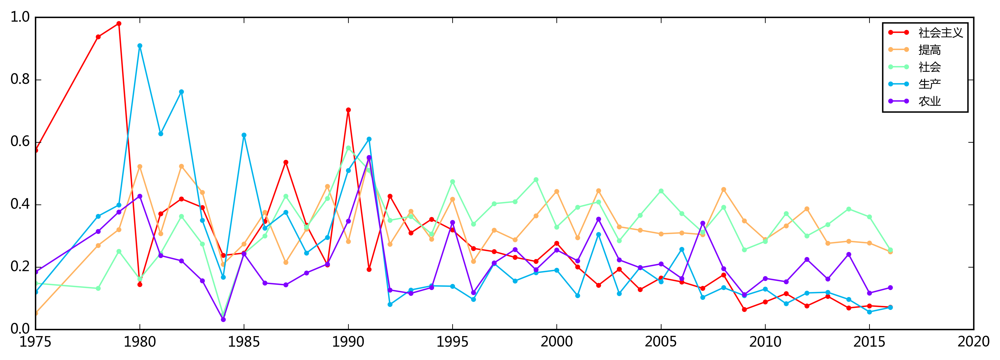

In [43]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[10:15]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

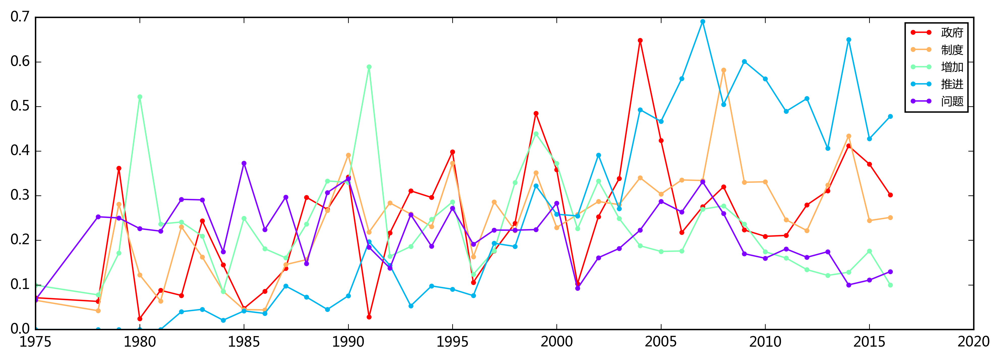

In [44]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[15:20]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

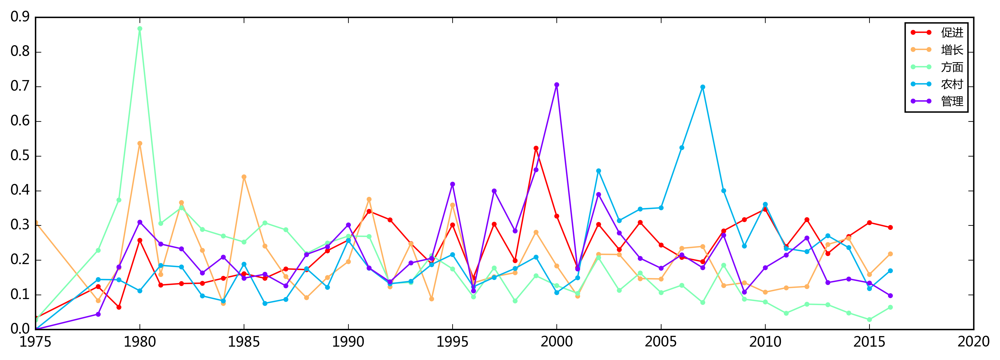

In [45]:

fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[20:25]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

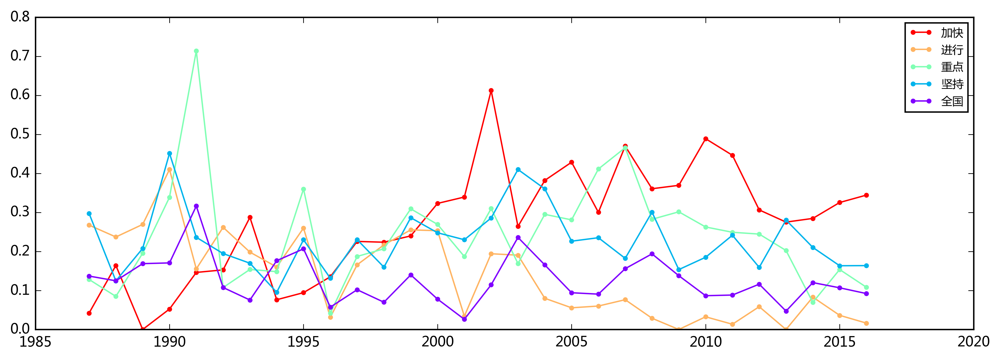

In [46]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[25:30]):
    years = data[word].keys()[-30:]
    tfidfs = data[word].values()[-30:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()